
This notebooks shows Grad-CAM visualizations of query-database pairs of a given query using embeddings generated from a single model. In classification tasks, Grad-CAM highlights pixels that activate/ contribute the most to the predicted class. 

The model output in our case is embeddings, so the task is to highlight regions of similarity in the query and database embeddings. 
Grad-CAM gradients are computed based on cosine similarity (instead of class logits) of query-database image embeddings and feature maps extracted from the convolutional layer (conv_g) before the attention block.

From the generated visualizations, the dorsal ridge seems to be the only significant discriminative feature. Where marks/ scars are present on the dorsal ridge, the model seems to focus on the scarred region in both the query and database image.


#Setup requirements

In [3]:
## Download data
# !gdown -O images.zip 1pXizjomDUqhNQYblFhmpayly2ozIJJBp
# !gdown -O demo.zip 16WVz3GQf_n0oAvAh4_2B577DP25SY7Dj
# !unzip -qqnd data images.zip
# !unzip -qqnd data demo.zip
# !cp -r data/demo/* data

## Download models
# !gdown -O submission.zip 1-14Nvvj2LL6CYfl5xYo7X9AJCfx2IX1k
# !unzip -qqn submission.zip

## Install requirements
# !pip install -qq timm==0.5.4 loguru 
# !pip install -qq torch==1.9.1  torchvision==0.10.1
# !pip install git+https://github.com/jacobgil/pytorch-grad-cam.git


Downloading...
From: https://drive.google.com/uc?id=1pXizjomDUqhNQYblFhmpayly2ozIJJBp
To: /content/images.zip
100% 262M/262M [00:08<00:00, 30.1MB/s]
Downloading...
From: https://drive.google.com/uc?id=16WVz3GQf_n0oAvAh4_2B577DP25SY7Dj
To: /content/demo.zip
100% 119k/119k [00:00<00:00, 90.4MB/s]
Downloading...
From: https://drive.google.com/uc?id=1-14Nvvj2LL6CYfl5xYo7X9AJCfx2IX1k
To: /content/submission.zip
100% 3.63G/3.63G [00:26<00:00, 135MB/s]
     |████████████████████████████████| 431 kB 9.7 MB/s 
     |████████████████████████████████| 58 kB 7.6 MB/s 
     |████████████████████████████████| 831.4 MB 7.1 kB/s 
     |████████████████████████████████| 22.1 MB 1.5 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.13.0 requires torch==1.12.0, but you have torch 1.9.1 which is incompatible.
torchaudio 0.12.0+cu113 requires torch==1.12.0, but you 

#Set variables

In [4]:
from pathlib import Path
import pandas as pd
from PIL import Image
from sklearn.metrics.pairwise import cosine_similarity
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import cv2
import torchvision
from pytorch_grad_cam.utils.image import show_cam_on_image, preprocess_image
from pytorch_grad_cam import *
import matplotlib.pyplot as plt
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
import warnings
warnings.simplefilter('ignore')
import os, glob
from model import *


ROOT_DIRECTORY = Path("./") #directory with 'data' directory 
MODEL_DIR = Path('./models') #model directory
PREDICTION_FILE = ROOT_DIRECTORY / "submission.csv" #path to generated solution csv file for the test scenarios

PLOT_FIGSIZE = 12 #

#path to pretrained model weights to use for visualization, change to use a different model
# weights_path = f'{MODEL_DIR}/models_eff5_r107_416/tf_efficientnet_b5_ns_f0_p1.pth' 
weights_path = f'{MODEL_DIR}/models_eff5_r107_416/tf_efficientnet_b5_ns_f1_p1.pth' 

print('Available models: ',glob.glob(f'{MODEL_DIR}/*/*'))

IMG_SIZE = int(weights_path.rsplit('/')[-2].split('_')[-1])
model  = load_model(weights_path) #load the model

DATA_DIRECTORY = ROOT_DIRECTORY / "data"

metadata = pd.read_csv(f'{DATA_DIRECTORY}/metadata.csv')
metadata['path'] = str(DATA_DIRECTORY) +'/'+ metadata.path
# metadata['whale_id'] = None # uncomment to set to None if whale_id is not available in metadata

predictions = pd.read_csv(f'{PREDICTION_FILE}')
predictions['query_image_id'] = predictions.query_id.str.split('-').str[1]
cols = ['query_id','database_image_id','query_image_id','score','db_image_path','db_whale_id']
data = pd.merge(predictions,metadata,left_on='database_image_id',right_on='image_id').rename(columns={'path':'db_image_path','whale_id':'db_whale_id'})[cols]
cols = cols+ ['qry_image_path','qry_whale_id']
data = pd.merge(data,metadata,left_on='query_image_id',right_on='image_id').rename(columns={'path':'qry_image_path','whale_id':'qry_whale_id'})[cols]
data = data.sort_values(by=['query_id','score'],ascending=[True,False]).reset_index(drop=True)
USE_CUDA = torch.cuda.is_available()



Available models:  ['models/models_eff7_r41_448/tf_efficientnet_b7_ns_f1_p1.pth', 'models/models_eff7_r41_448/tf_efficientnet_b7_ns_f2_p1.pth', 'models/models_eff7_r41_448/tf_efficientnet_b7_ns_f0_p1.pth', 'models/models_eff7_r41_448/tf_efficientnet_b7_ns_f4_p1.pth', 'models/models_eff7_r41_448/tf_efficientnet_b7_ns_f3_p1.pth', 'models/models_eff5_r107_416/tf_efficientnet_b5_ns_f2_p1.pth', 'models/models_eff5_r107_416/tf_efficientnet_b5_ns_f4_p1.pth', 'models/models_eff5_r107_416/tf_efficientnet_b5_ns_f1_p1.pth', 'models/models_eff5_r107_416/tf_efficientnet_b5_ns_f3_p1.pth', 'models/models_eff5_r107_416/tf_efficientnet_b5_ns_f0_p1.pth', 'models/models_eff7_r888_256/tf_efficientnet_b7_ns_f1_p1.pth', 'models/models_eff7_r888_256/tf_efficientnet_b7_ns_f2_p1.pth', 'models/models_eff7_r888_256/tf_efficientnet_b7_ns_f0_p1.pth', 'models/models_eff7_r888_256/tf_efficientnet_b7_ns_f4_p1.pth', 'models/models_eff7_r888_256/tf_efficientnet_b7_ns_f3_p1.pth']



In [5]:
def preprocess_image(img):
    tfm = transforms.Compose([
                              transforms.ToTensor(),
                              transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
    ])
    
    return tfm(img.copy()).unsqueeze(0)

def get_image(path):
    img = cv2.imread(path)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    og_img = np.copy(img)
    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
    rgb_img_float = np.float32(img) / 255
    input_tensor = preprocess_image(rgb_img_float).to(DEVICE)
    return og_img, rgb_img_float, input_tensor

class SimilarityToConceptTarget:
    def __init__(self, features):
        self.features = features
    
    def __call__(self, model_output):
        cos = torch.nn.CosineSimilarity(dim=0)
        return cos(model_output, self.features)

#Generate visualizations

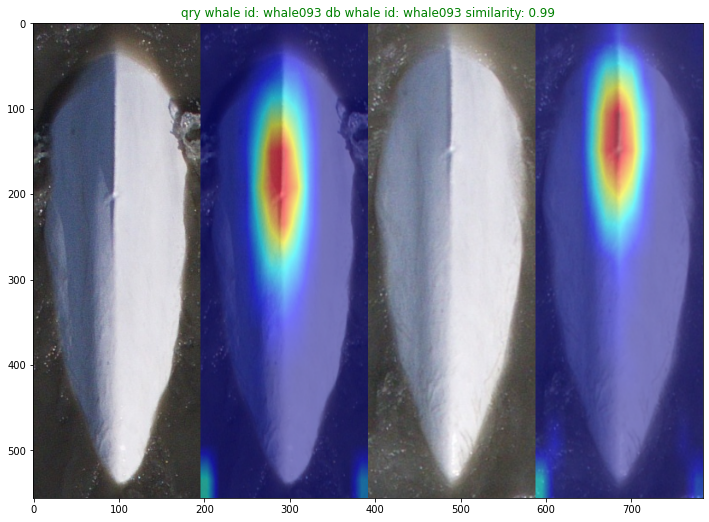

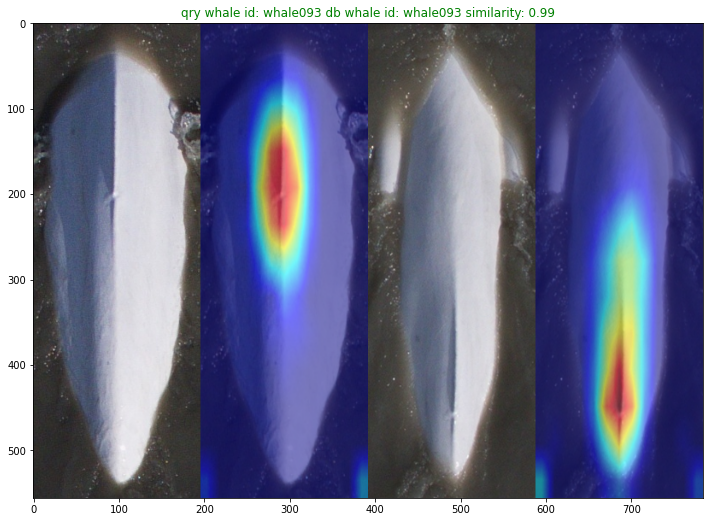

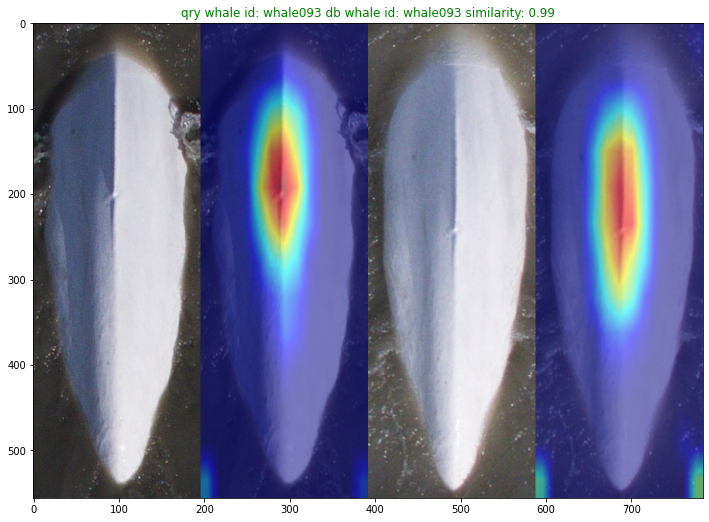

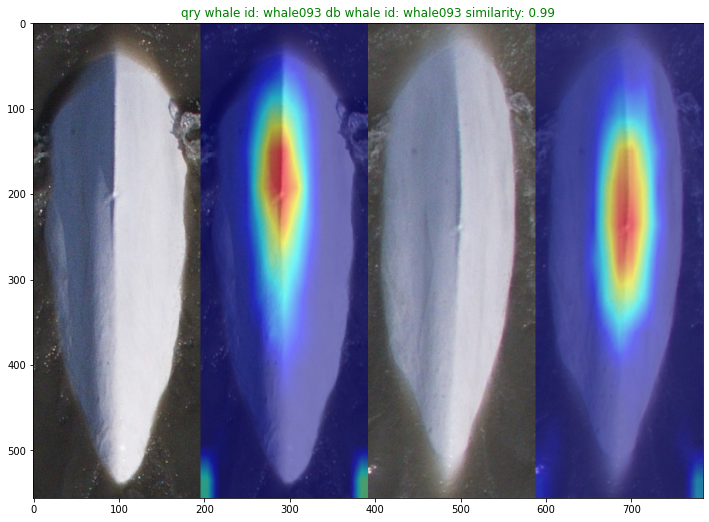

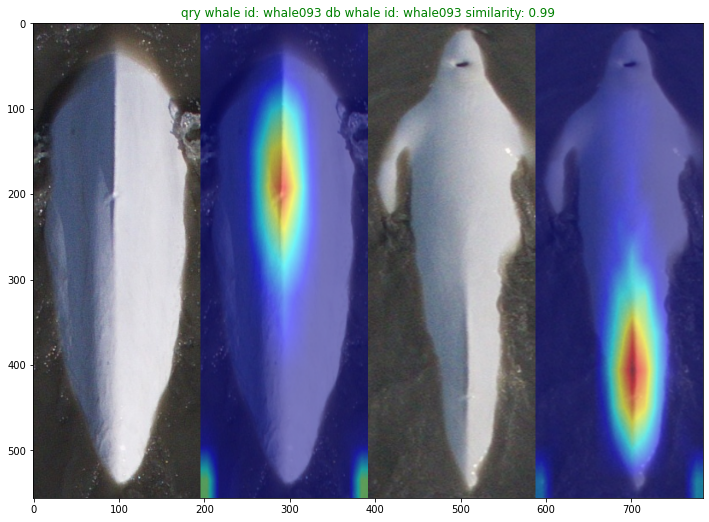

...

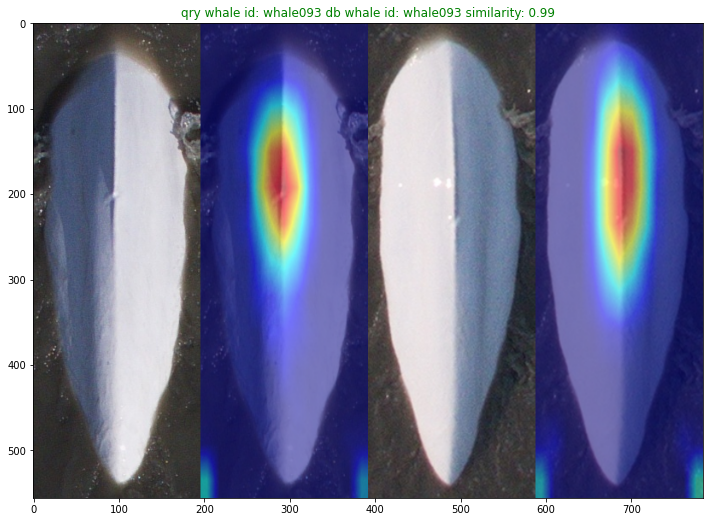

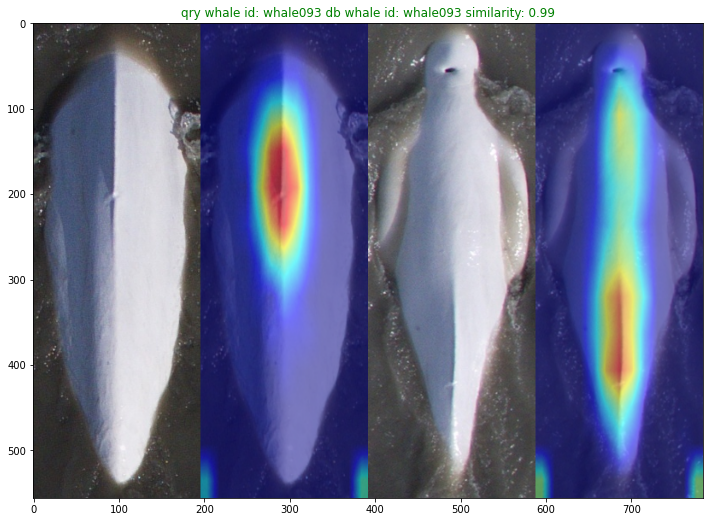

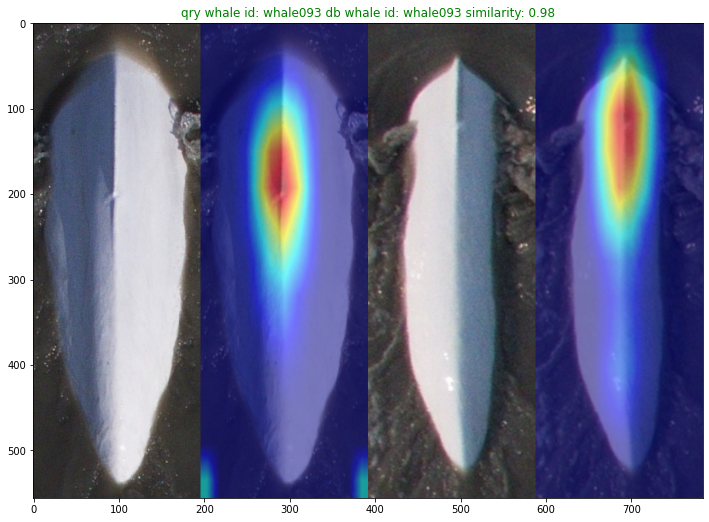

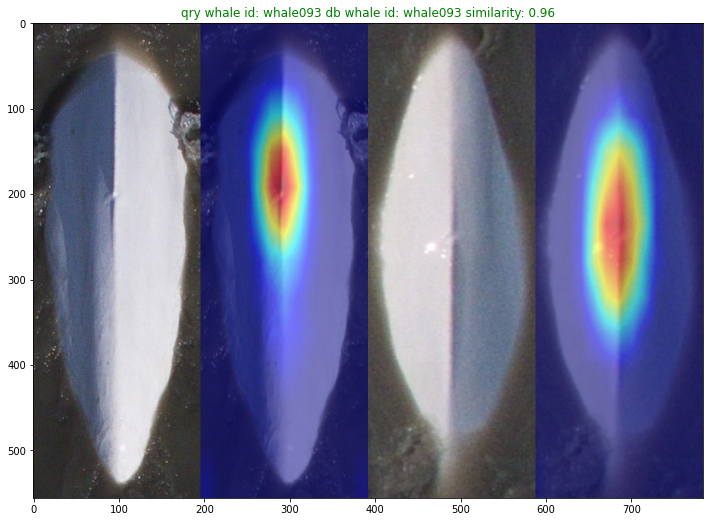

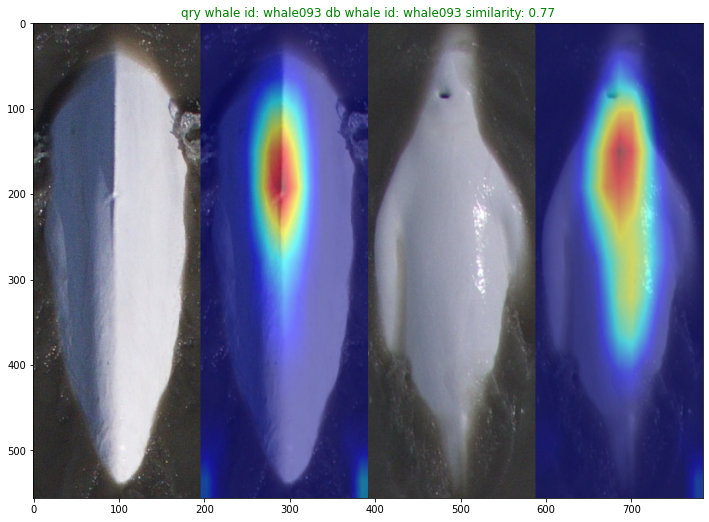

In [6]:
query_id = 's0-train4648' ##query to visualize
df = data[data.query_id==query_id].copy()
generate_cam = GradCAMPlusPlus(model=model,target_layers=[model[1].conv_g],use_cuda=USE_CUDA)
qry_img, qry_float, qry_tensor = get_image(df.qry_image_path.values[0])
qry_input_shape =  [qry_img.shape[1],qry_img.shape[0]]
qry_features = model(qry_tensor)[0]
similarity_to_qry = SimilarityToConceptTarget(qry_features)

for _,row in df.iterrows():
  db_img, db_float, db_tensor = get_image(row.db_image_path)
  db_img = cv2.resize(db_img,qry_input_shape)  
  db_features = model(db_tensor)[0]
  similarity_to_db = SimilarityToConceptTarget(db_features)
  
  qry_grayscale_cam = generate_cam(input_tensor=db_tensor,targets=[similarity_to_qry],aug_smooth=True,eigen_smooth=True)[0, :]
  db_grayscale_cam = generate_cam(input_tensor=qry_tensor,targets=[similarity_to_db],aug_smooth=True,eigen_smooth=True)[0, :]

  cam_image_db = show_cam_on_image(db_float, qry_grayscale_cam, use_rgb=True)
  cam_image_db = cv2.resize(cam_image_db,qry_input_shape)

  cam_image_qry = show_cam_on_image(qry_float, db_grayscale_cam, use_rgb=True)
  cam_image_qry = cv2.resize(cam_image_qry,qry_input_shape)
  res_img = Image.fromarray(np.hstack((qry_img,cam_image_qry,db_img,cam_image_db)))

  plt.figure(figsize=(PLOT_FIGSIZE,PLOT_FIGSIZE))
  color = 'green'
  if row.db_whale_id != row.qry_whale_id:
    color= 'red'
  plt.title(f'qry whale id: {row.qry_whale_id} db whale id: {row.db_whale_id} similarity: {np.round(row.score,2)}',color=color)
  plt.imshow(res_img)
  